# 19 - Valentine's

In [1]:
import altair as alt
from pathlib import Path
import json

In [2]:
%%html
<style>
@import url('https://fonts.googleapis.com/css?family=Ubuntu|Ubuntu+Condensed|Ubuntu+Mono');
</style>

In [3]:
%run theme.py

In [4]:
outlines_path = Path("../data/interim/outline_4326.geojson") 
cities_path = Path("../data/interim/cities.geojson")

In [5]:
with open(outlines_path, "r") as file:
    outlines = json.load(file)
    
with open(cities_path, 'r', encoding = 'utf-8') as file:
    cities = json.load(file)

In [6]:
outlines_data = alt.Data(values = outlines['features'])
cities_data = alt.Data(values = cities['features'])

In [7]:
yaw_pitch_roll = [90,-60,0]

In [8]:
base = alt.Chart(outlines_data).mark_geoshape(stroke = 'black', strokeWidth = .5, fill = '#FCFCFC').encode().project('orthographic', center = [41.8,-104.5], rotate = yaw_pitch_roll).properties(height = 1350, width = 1080)

In [9]:
city_points = alt.Chart(cities_data).mark_text().encode(
    longitude='properties.longitude:Q',
    latitude='properties.latitude:Q',
    text = alt.Text('properties.emoji_blue:N',),
    size=alt.value(45),
    color=alt.value('red')
)

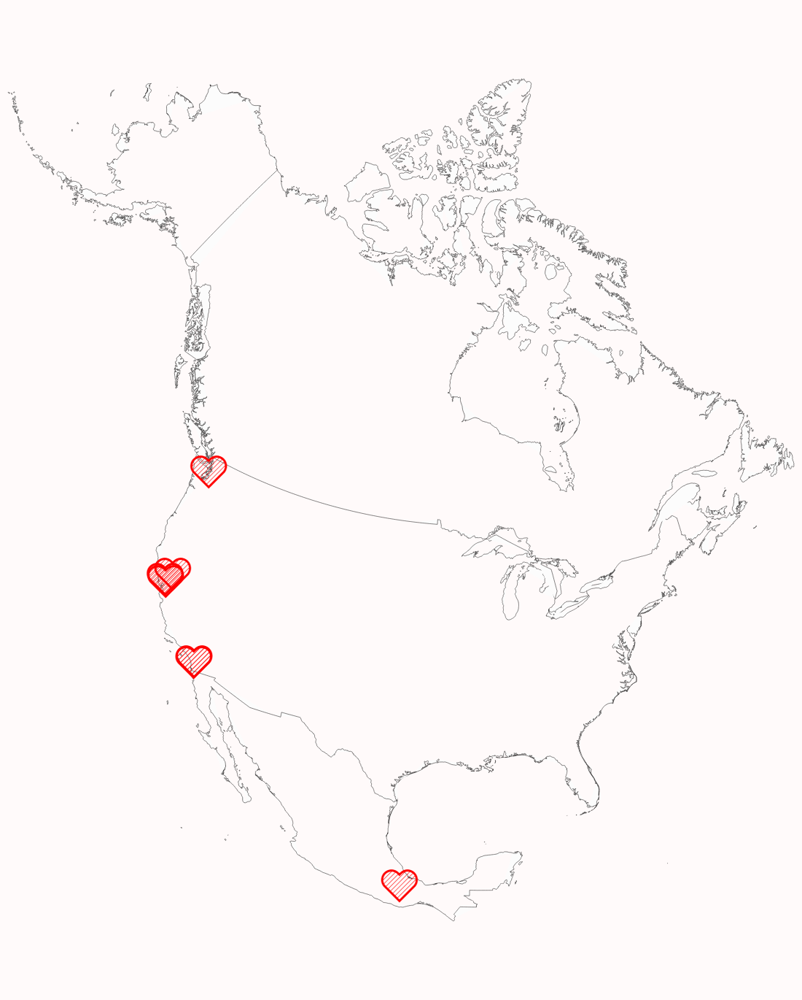

In [10]:
chart = base + city_points
chart